# Introduction

The following notebook will explore the taxi dataset provided by the _NYC Taxi and Limousine Commission (TLC)_. The main concerns of this notebook will be as follows:
* Explore the acessability and copyrights of the provided data
* Describe the methodology of data collection
* Check the data for structural and non-structural missingness, removing observations with missing values
    * This includes also dropping variables with large percentage of missingness
* Check the validity of entries (range is within resonable boundaries inferred from domain knowledge and common sense)
* Remove redundancy

# Data collection and copyrights

Following the [information](https://www.nyc.gov/assets/tlc/downloads/pdf/trip_record_user_guide.pdf) given by the TLC, we can clearly see that the "Yellow Taxi Cab" data from May 2015 is provided under the *Open Aceess* license. Thus, we may freely explore and manipulate the data for educational purposes.

As for data collection, we note that most of the variables were recorded automatically by the measurment apparatuses in the taxi as well as the driver themself. This information is confirmed and exracted from the following link [1](https://www.nyc.gov/assets/tlc/downloads/pdf/data_dictionary_trip_records_yellow.pdf) [2](https://datasciencebocconi.github.io/Courses/Foundations/web/taxi_homework.html).

# Structural and non-structural missingness

## Auxiliary function and imports

Here we define some useful utility functions which will be used throughout the report.

In [70]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler

def preview_dataset(df):
    print(df.head())
    print(df.info())
    print(df.describe())
    print(df.columns)

def load_dataset(file):
    return pd.read_csv(file)

df = load_dataset('data/taxi_tidy_org.csv')


## Assessing missingness

### Non-structural missingness

Non-structural missingness refers to situations where missing data lacks a systematic pattern. This missingness falls into two categories:

- **Missing Completely at Random (MCAR):** The missing data is entirely random and has no relationship with other variables. Let $M_i^X$ = $1$(variable $X$ is missing for datapoint $i$). Let $W$ be a random matrix collecting all the pertinent study variables, observed or unobserved. Then $P(M_i^X = 1) = P(M_i^X = 1 | W = w)$. MCAR, in most cases, is an unrealistically strong presumption. In such cases, omission of missing data doesn't introduce structural bias in the data.
- **Missing at Random (MAR):** The pattern of missing data is related to observed variables in the dataset, but not to the specific missing value itself. Mathematically, $P(M_i^X = 1) = P(M_i^X = 1 | X_i=x_i)$ where probability is conditioned on the true, possibly unobserved, value of $X_i$.



Missing values for each column in percentage:
 Unnamed: 0           0.0
pickup_hour          0.0
pickup_month         0.0
pickup_week          0.0
pickup_doy           0.0
pickup_wday          0.0
length_time          0.0
pickup_BoroCode      0.0
pickup_NTACode       0.0
dropoff_BoroCode     0.0
dropoff_NTACode      0.0
pickup_longitude     0.0
pickup_latitude      0.0
dropoff_longitude    0.0
dropoff_latitude     0.0
vendor_id            0.0
passenger_count      0.0
trip_distance        0.0
fare_amount          0.0
pair                 0.0
dtype: float64


/Users/aliakh/Documents/GitHub/ds_taxi_homework/env/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/Users/aliakh/Documents/GitHub/ds_taxi_homework/env/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


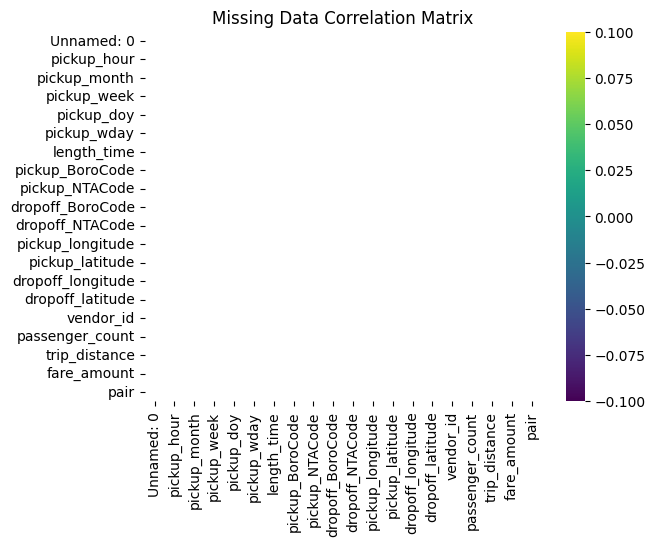

In [71]:
import pandas as pd
import missingno as msno

# Missing Data Analysis
# Checking the percentage of missing values in each column
missing_data = df.isnull().mean() * 100
print("\nMissing values for each column in percentage:\n", missing_data)

# Missing Data Correlation Analysis
# We will create a nullity matrix where missing data points are denoted with 1 and non-null data points are denoted with 0. 
# This allows us to calculate how the presence of missing data in one column is related to others.

# Create nullity matrix
nullity = df.isnull()

# Create correlation heatmap for missing data
sns.heatmap(nullity.corr(), annot=True, cmap='viridis')

plt.title('Missing Data Correlation Matrix')
plt.show()

It appears that the data is intact and there are no missing values. Therefore, there can't be any structural missingness either. 

We continue to examine whether each observation follows domain specific expectation we have for it. For example, the _pair_ column is expected to be a string equal to the concatenated result of _pickup_NTACode_ and _dropoff_NTACode_. We begin with a preview of the data.

In [72]:
print("The 'pair' column is the concatenation of the 'pickup_NTACode' and the 'dropoff_NTACode':",
 df['pair'].equals(df['pickup_NTACode'] + "-" + df['dropoff_NTACode']))

if df['pair'].equals(df['pickup_NTACode'] + "-" + df['dropoff_NTACode']):
    print("pickup_NTACode and dropoff_NTACode are redundant")
    df.drop(columns=['pickup_NTACode', 'dropoff_NTACode'], inplace=True)

print("'pickup_doy' is between May 1st and May 31st:", df['pickup_doy'].between(121, 152).all())

print("'pickup_wday' is between 1 and 7:", df['pickup_wday'].between(1, 7).all())

print("'length_time' is positive:", (df["length_time"] > 0).all())

print("'fare_amount' is positive:", (df["fare_amount"] > 0).all())

print("'trip_distance' is positive:", (df["trip_distance"] > 0).all())

The 'pair' column is the concatenation of the 'pickup_NTACode' and the 'dropoff_NTACode': True
pickup_NTACode and dropoff_NTACode are redundant
'pickup_doy' is between May 1st and May 31st: True
'pickup_wday' is between 1 and 7: True
'length_time' is positive: False
'fare_amount' is positive: True
'trip_distance' is positive: False


There are datapoints with negative or zero `length_time` and `trip_distance`. That's problematic. Let's start with `length_time`.

In [73]:
df[df.length_time <= 0]

,Unnamed: 0,pickup_hour,pickup_month,pickup_week,pickup_doy,pickup_wday,length_time,pickup_BoroCode,dropoff_BoroCode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount,pair
67425,67426,0,5,20,140,5,0,4,1,-73.781052,40.644997,-73.996933,40.761620,2,1,18.17,52.0,QN98-MN15
133170,133171,0,5,22,150,1,0,1,3,-73.999733,40.733437,-73.942871,40.677292,2,1,7.63,30.0,MN23-BK61
133282,133283,0,5,19,127,6,0,1,1,-73.994598,40.750092,-73.921638,40.866402,2,1,10.17,52.5,MN17-MN01
195373,195374,23,5,20,140,5,0,4,1,-73.781830,40.644669,-73.976044,40.744888,2,2,16.61,52.0,QN98-MN20
224232,224233,23,5,19,130,2,0,1,1,-73.962402,40.767326,-73.980606,40.739452,2,1,9.00,26.5,MN40-MN20
306685,306686,0,5,19,128,7,0,4,4,-73.937325,40.757896,-73.936760,40.764584,2,1,0.00,2.5,QN68-QN70
327737,327738,0,5,20,138,3,0,3,1,-73.990829,40.686001,-73.983177,40.744690,2,2,7.21,28.0,BK38-MN17
409413,409414,0,5,21,147,5,0,4,1,-73.871201,40.773891,-73.952881,40.824696,2,5,8.28,27.0,QN98-MN04
411312,411313,0,5,21,147,5,0,1,4,-73.987450,40.749382,-73.849152,40.723583,2,1,8.19,31.0,MN17-QN17
485878,485879,7,5,18,124,3,0,4,3,-73.788841,40.642948,-73.940361,40.715801,2,1,15.49,51.0,QN98-BK90


Looks like a few taxi drivers might be secretly testing out prototype teleportation devices. Zero `length_time` yet a positive `fare_amount` and `trip_distance`.  For the sake of data sanity, we'll have to remove these suspicious entries.

In [74]:
df = df[df.length_time > 0]

In [75]:
df[df.trip_distance == 0]

,Unnamed: 0,pickup_hour,pickup_month,pickup_week,pickup_doy,pickup_wday,length_time,pickup_BoroCode,dropoff_BoroCode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount,pair
233,234,22,5,19,127,6,146,4,4,-73.911804,40.783085,-73.911804,40.783081,1,1,0.0,38.8,QN72-QN72
1688,1689,21,5,19,129,1,3834,4,1,-73.790512,40.643993,-73.981155,40.776756,1,1,0.0,52.0,QN98-MN14
2966,2967,15,5,19,128,7,3,1,1,-73.991661,40.730068,-73.991653,40.730076,1,1,0.0,2.5,MN23-MN23
3236,3237,23,5,21,147,5,48,1,1,-73.942055,40.835396,-73.942062,40.835388,2,1,0.0,52.0,MN36-MN36
3619,3620,10,5,18,126,5,788,1,1,-73.975471,40.755363,-73.985603,40.741329,2,1,0.0,9.0,MN17-MN13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485548,485549,15,5,19,130,2,7,1,1,-74.003227,40.756222,-74.003227,40.756222,2,1,0.0,15.0,MN13-MN13
488993,488994,6,5,20,140,5,713,1,1,-73.991402,40.723930,-73.991402,40.723927,2,2,0.0,24.0,MN22-MN22
489182,489183,23,5,20,134,6,3,1,1,-73.946060,40.782200,-73.946060,40.782200,2,1,0.0,15.3,MN32-MN32
490178,490179,0,5,20,139,4,27,3,3,-73.993050,40.619965,-73.993050,40.619965,1,1,0.0,14.0,BK28-BK28


We have trips showing both zero distance and a positive fare. Unless these passengers really enjoyed a NY tour that ended exactly where they started, it seems like there might be some errors in the location data. Let's verify if the pickup and dropoff coordinates match.

In [76]:
df[(df.trip_distance == 0) & (df.pickup_latitude != df.dropoff_latitude) & (df.dropoff_longitude != df.pickup_longitude)]

,Unnamed: 0,pickup_hour,pickup_month,pickup_week,pickup_doy,pickup_wday,length_time,pickup_BoroCode,dropoff_BoroCode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount,pair
1688,1689,21,5,19,129,1,3834,4,1,-73.790512,40.643993,-73.981155,40.776756,1,1,0.0,52.0,QN98-MN14
2966,2967,15,5,19,128,7,3,1,1,-73.991661,40.730068,-73.991653,40.730076,1,1,0.0,2.5,MN23-MN23
3236,3237,23,5,21,147,5,48,1,1,-73.942055,40.835396,-73.942062,40.835388,2,1,0.0,52.0,MN36-MN36
3619,3620,10,5,18,126,5,788,1,1,-73.975471,40.755363,-73.985603,40.741329,2,1,0.0,9.0,MN17-MN13
3806,3807,17,5,20,136,1,35,1,1,-73.980057,40.783958,-73.979958,40.783901,1,1,0.0,2.5,MN12-MN12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481888,481889,12,5,21,146,4,12,1,1,-73.980721,40.764736,-73.980858,40.764778,2,2,0.0,52.0,MN17-MN17
483167,483168,6,5,19,129,1,8,1,1,-73.978523,40.780579,-73.978500,40.780655,2,1,0.0,52.0,MN12-MN12
483173,483174,2,5,20,139,4,2,1,1,-73.992729,40.768337,-73.992737,40.768349,2,1,0.0,6.0,MN15-MN15
485338,485339,13,5,20,135,7,3178,1,4,-73.999664,40.743553,-73.782936,40.648617,2,1,0.0,52.0,MN13-QN98


These values must be removed also.

In [77]:
df = df[(df.trip_distance > 0) | (df.pickup_latitude == df.dropoff_latitude) & (df.dropoff_longitude == df.pickup_longitude)]

Now, we'll verify if the distance is cogent with longitude and latitude data.

In [78]:
from math import radians, cos, sin, asin, sqrt

def haversine_miles(lon1, lat1, lon2, lat2):
    """https://en.wikipedia.org/wiki/Haversine_formula"""
    R = 3959 # Radius of Earth in miles

    dlon = radians(lon2 - lon1)
    dlat = radians(lat2 - lat1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    distance = R * c

    return distance

def check_trip_distance(df):
    """
    Checks if the calculated trip distances match the recorded values within a tolerance.
    """
    tolerance = 1 
    
    tot_deviating = 0
    for index, row in df.iterrows():
        calculated_distance = haversine_miles(row['pickup_longitude'], row['pickup_latitude'], 
                                             row['dropoff_longitude'], row['dropoff_latitude'])

        if abs(calculated_distance - row['trip_distance']) > row['trip_distance'] * tolerance:
            tot_deviating += 1
    
    return round(tot_deviating / len(df.index) * 100, 2)

print(f"{check_trip_distance(df)}% of the reported distances deviate from the calculated distance.")

0.03% of the reported distances deviate from the calculated distance.


There doesn't seem to be a significant portion of the data that deviate from the calculated distance using the Haversine formula. Note that `trip_distance` is **the elapsed distance** while the computed distance is the **straight-line distance**. Therefore, we tolerate a difference between the two values to a certain level.

## Reducing redundancy

We already dropped the `pair` column as it's redundant. Additionally, we will convert the pickup and dropoff times to a format more appropriate for modelling purposes

In [79]:
# Convert the pickup_hour: Hour of the pick-up
# pickup_month: Month of the pick-up (always May)
# pickup_week: Week of the pick-up
# pickup_doy: Day of the year of the pick-up (from 1 to 365)
# pickup_wday: Day of the week of the pick-up (from 1 to 7)
# to absolute epoch timestamps

def combine_datetime(row):
    return pd.Timestamp(year=2015, 
                        month=row['pickup_month'], 
                        day=row['pickup_doy'] - 121, 
                        hour=row['pickup_hour'])

# We apply this function to each row of the DataFrame
df['pickup_time'] = df.apply(combine_datetime, axis=1)

# We then convert the datetime from being expressed in local time to being expressed 
# as a Unix timestamp (the number of seconds since 1970-01-01 00:00:00 UTC)
df['pickup_time'] = (df['pickup_time'] - pd.Timestamp("1970-01-01 00:00:00")) // pd.Timedelta('1s')

In [80]:
df.drop(columns=['pickup_month', 'pickup_week', 'pickup_doy', 'pickup_wday', 'pickup_hour'], inplace=True)

print(df.sample(5))

        Unnamed: 0  length_time  pickup_BoroCode  dropoff_BoroCode  \
205074      205075          660                1                 1   
352646      352647         1306                1                 1   
397835      397836         1756                1                 4   
31831        31832          564                1                 1   
141577      141578         2787                1                 4   

        pickup_longitude  pickup_latitude  dropoff_longitude  \
205074        -73.979233        40.750309         -73.986397   
352646        -73.978844        40.762146         -73.976501   
397835        -73.972054        40.755882         -73.871849   
31831         -73.989243        40.753052         -73.982033   
141577        -73.996971        40.725319         -73.864136   

        dropoff_latitude  vendor_id  passenger_count  trip_distance  \
205074         40.732071          2                2           1.67   
352646         40.755562          1                2

## Graphical exploration

Now that we have assessed that no values are missing and that the variables are withing reasonable range, we will explore the dataset visuallize with box-plots and historgrams.

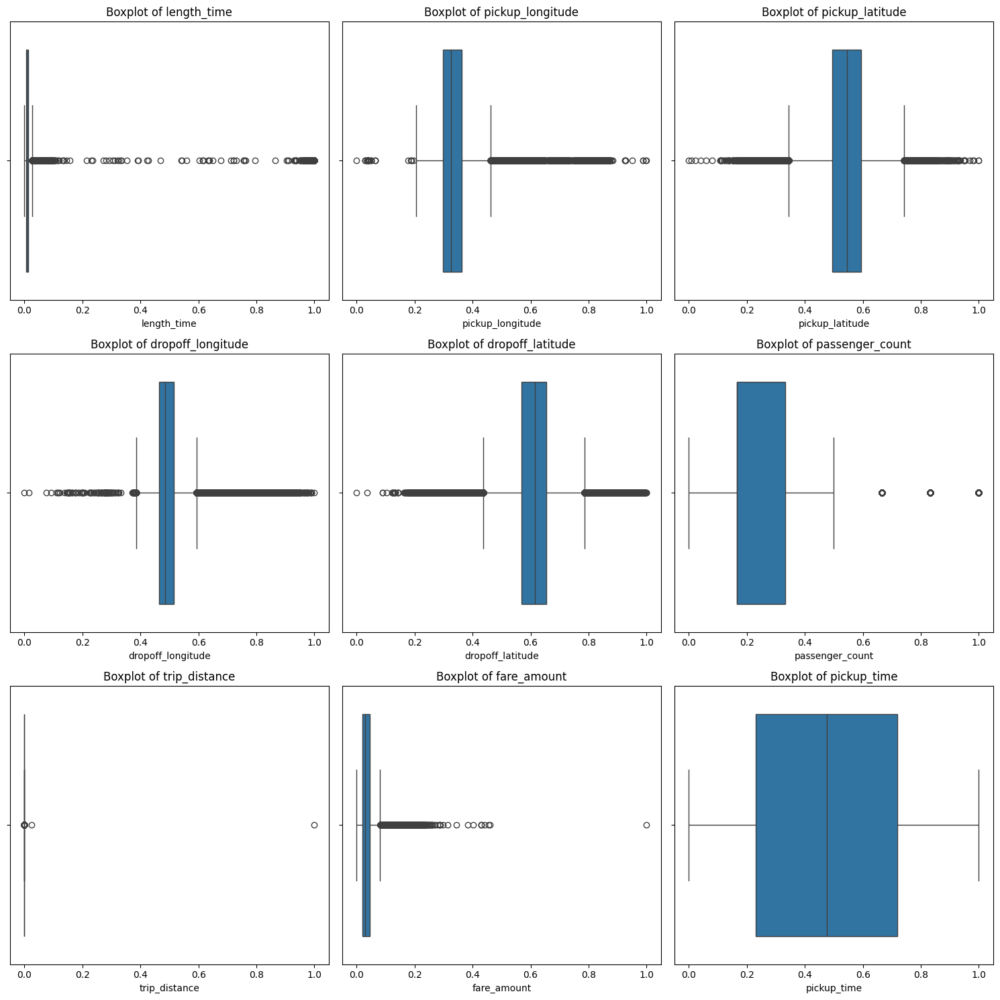

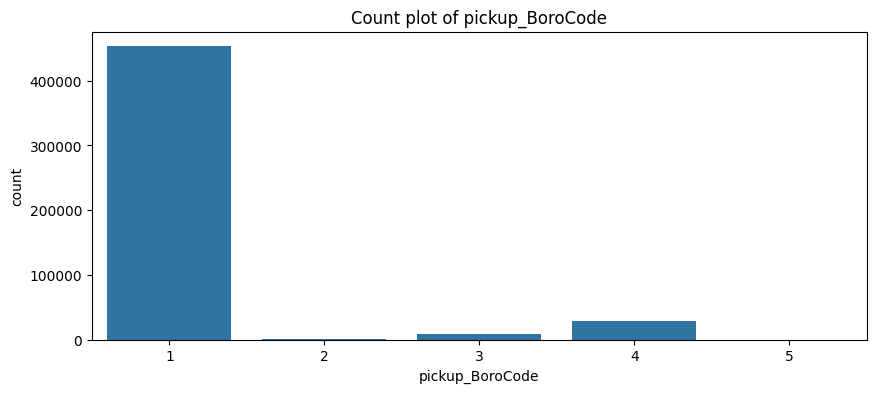

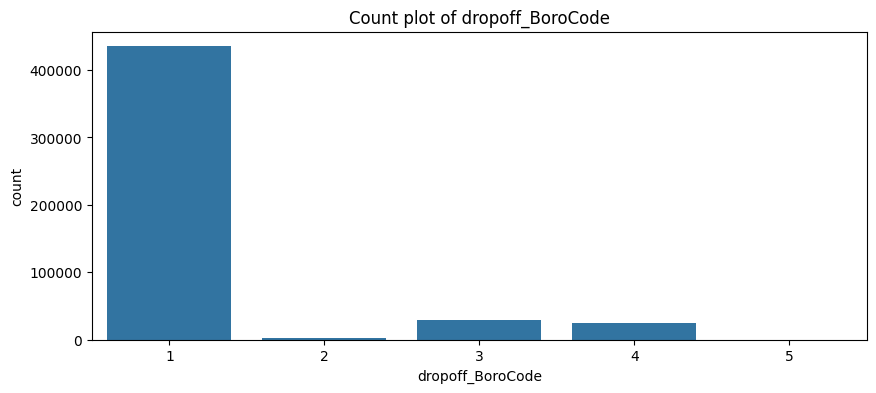

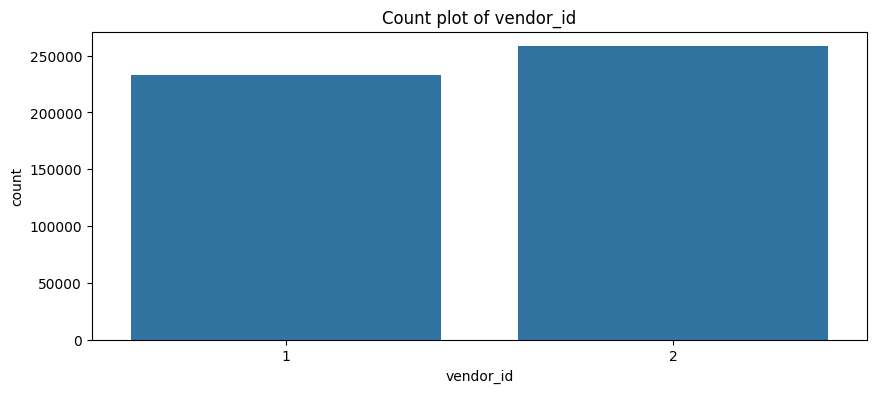

In [81]:
numerical_cols = ["length_time", "pickup_longitude", "pickup_latitude", "dropoff_longitude", "dropoff_latitude", "passenger_count", "trip_distance", "fare_amount", "pickup_time"]
# Normalize the numerical features to get meaningful plots
scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df[numerical_cols]), columns=numerical_cols)

# Define number of rows and columns for subplot grid
num_vars = len(numerical_cols)
num_cols = int(num_vars**0.5)
num_rows = num_vars // num_cols + (num_vars % num_cols > 0)

# Create subplots of boxplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 15))

for ax, col in zip(axs.flat, numerical_cols):
    sns.boxplot(x=df_normalized[col], ax=ax)
    ax.set_title(f'Boxplot of {col}')

# Delete remaining empty subplots when the number of variable is not a perfect square
for ax in axs.flat[len(numerical_cols):]:
    fig.delaxes(ax)
    
plt.tight_layout()
plt.show()


categorical_cols = ["pickup_BoroCode", "dropoff_BoroCode", 'vendor_id', "pair"]
# As for the categorical features, let's see the frequency of each category (bar plots)
for col in categorical_cols:
    if df[col].nunique() < 30:  # Only plot for columns with less unique entries
        fig, ax = plt.subplots(figsize=(10, 4))
        sns.countplot(data=df, x=col, ax=ax)
        ax.set_title(f'Count plot of {col}')
        plt.show()

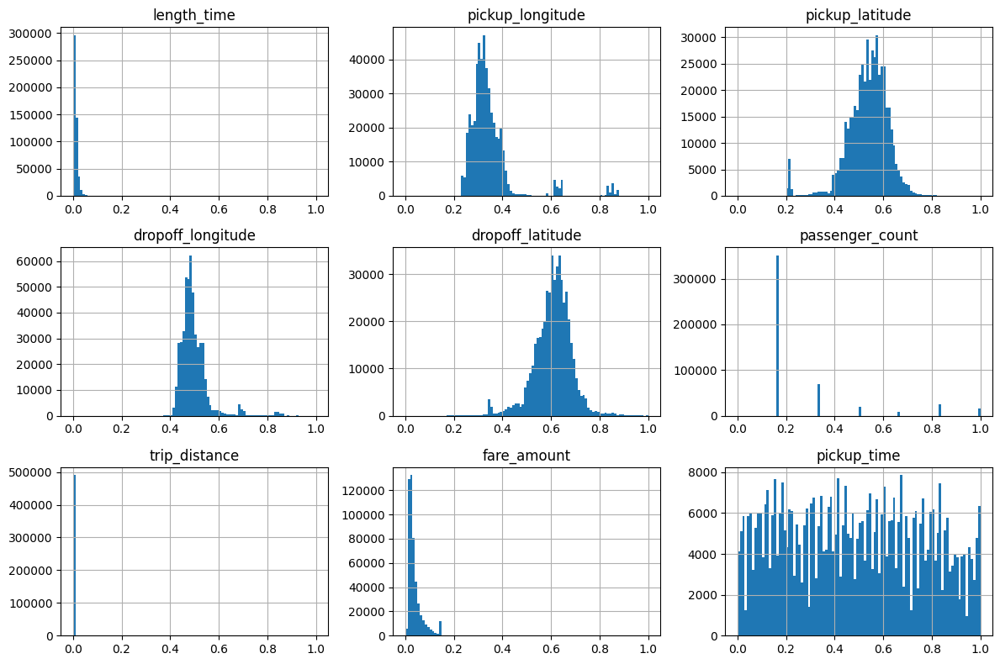

In [82]:
df_normalized.hist(figsize=(12, 8), bins=100)
plt.tight_layout()
plt.show()


Our initial analysis reveals outliers in the data and uneven representation of different areas. This geographic disparity should be considered during our statistical analysis. The distributions of `length_time`, `fare_amount`, and `trip_distance` visually resemble exponential or power law distributions.  Verifying this hypothesis is crucial, as it would imply that extreme values are inherent to the distribution and shouldn't be discarded as outliers. Traditional outlier detection methods like Z-Scores or IQR might not be suitable in this case.

## Correlation Analysis

We expect, naturally, to see correlation between some of the variables. This is not, per se, an issue. But could be problematic based on the models used in downstream analysis.

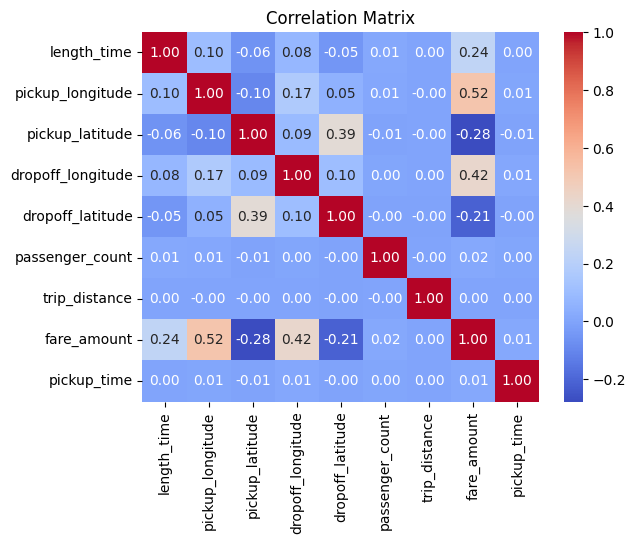

<Figure size 2400x1600 with 0 Axes>

In [83]:
corr_matrix = df_normalized[numerical_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.figure(figsize=(24, 16))  
plt.show()

Note that there are more complex, non-linear ways that the data is correlated. For example, knowing the pickup and dropoff coordinates, we can determine the Borough Code. Possibly, we could guess the vendor by knowing the pickup coordinates. We'll draw a scatterplot to check this hypothesis.

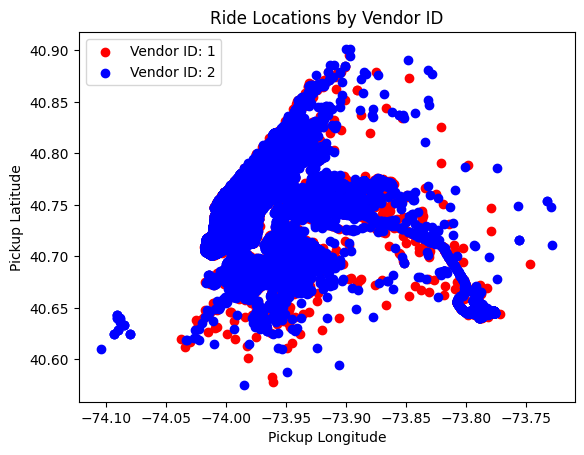

In [84]:
for vendor_id, group in df.groupby('vendor_id'):
    plt.scatter(group['pickup_longitude'], group['pickup_latitude'], 
                color='red' if vendor_id == 1 else 'blue',
                label=f"Vendor ID: {vendor_id}")

plt.xlabel("Pickup Longitude")
plt.ylabel("Pickup Latitude")
plt.title("Ride Locations by Vendor ID")
plt.legend()
plt.show()

We can see that this is not the case.

/var/folders/ts/xsr5s4hn2zs46ml6rgb5_42m0000gp/T/ipykernel_26065/1156832634.py:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(df['pickup_longitude'], df['pickup_latitude'],
/var/folders/ts/xsr5s4hn2zs46ml6rgb5_42m0000gp/T/ipykernel_26065/1156832634.py:17: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Fare Amount')


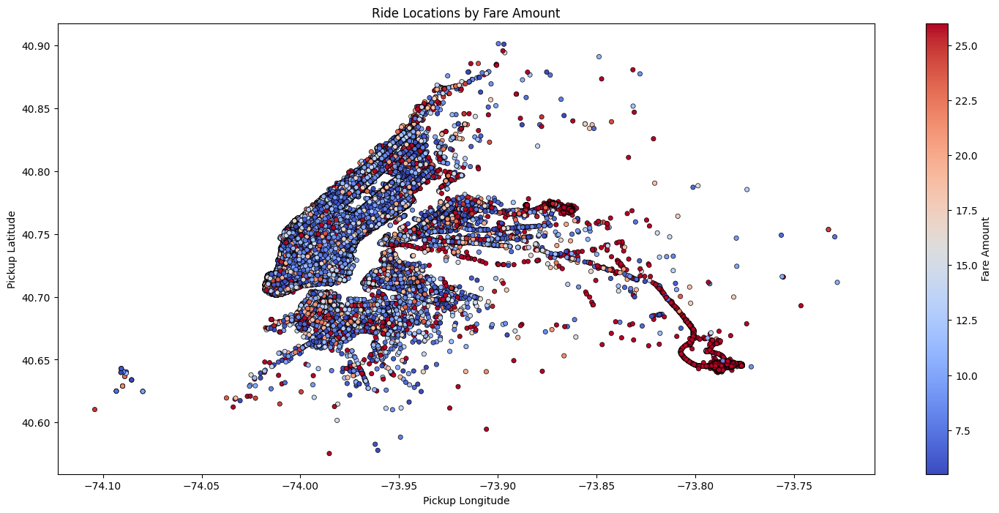

In [100]:
from matplotlib.cm import ScalarMappable

cmap = plt.cm.coolwarm
lower_percentile = df['fare_amount'].quantile(0.1)
upper_percentile = df['fare_amount'].quantile(0.9)
norm = plt.Normalize(lower_percentile, upper_percentile)
plt.figure(figsize=(18,8))
sm = ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([]) 

plt.scatter(df['pickup_longitude'], df['pickup_latitude'], 
            c=cmap(norm(df['fare_amount'])), 
            s=20, 
            cmap=cmap,
            edgecolors='black',
            linewidths=0.5)
plt.colorbar(sm, label='Fare Amount')
plt.xlabel("Pickup Longitude")
plt.ylabel("Pickup Latitude")
plt.title("Ride Locations by Fare Amount")
plt.show()

On the other hand, we can see patterns where rides from certain locations are more expensive. We compute the $r^2$.

In [102]:
import statsmodels.api as sm

X = df[['pickup_longitude', 'pickup_latitude']]
y = df['fare_amount']
X = sm.add_constant(X) 
model = sm.OLS(y, X).fit()
print(model.summary())  


                            OLS Regression Results                            
Dep. Variable:            fare_amount   R-squared:                       0.320
Model:                            OLS   Adj. R-squared:                  0.320
Method:                 Least Squares   F-statistic:                 1.157e+05
Date:                Wed, 10 Apr 2024   Prob (F-statistic):               0.00
Time:                        14:32:39   Log-Likelihood:            -1.7453e+06
No. Observations:              490690   AIC:                         3.491e+06
Df Residuals:                  490687   BIC:                         3.491e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             1.351e+04     28.465  

The large F-statistic and very small p-value indicate that the model is statistically significant and there's a correlation between pickup coordinates and the fare amount. Again, this is not necessarily problematic but must be considered during model selection.

## Conclusion

In conclusion, we'll take the original dataset, tidy it up, and store it in the data folder.

In [107]:
org_df = load_dataset('data/taxi_tidy_org.csv')

In [108]:
def combine_datetime(row):
    return pd.Timestamp(year=2015, 
                        month=row['pickup_month'], 
                        day=row['pickup_doy'] - 121, 
                        hour=row['pickup_hour'])

# We apply this function to each row of the DataFrame
org_df['pickup_time'] = org_df.apply(combine_datetime, axis=1)

# We then convert the datetime from being expressed in local time to being expressed 
# as a Unix timestamp (the number of seconds since 1970-01-01 00:00:00 UTC)
org_df['pickup_time'] = (org_df['pickup_time'] - pd.Timestamp("1970-01-01 00:00:00")) // pd.Timedelta('1s')
org_df.drop(columns=['pickup_month', 'pickup_week', 'pickup_doy', 'pickup_wday', 'pickup_hour', 'pair'], inplace=True)
org_df.head(5)

,Unnamed: 0,length_time,pickup_BoroCode,pickup_NTACode,dropoff_BoroCode,dropoff_NTACode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount,pickup_time
0,1,520,1,MN15,1,MN19,-73.983009,40.766602,-73.967972,40.760677,1,1,0.90,7.0,1431367200
1,2,672,1,MN24,1,MN17,-74.009789,40.712395,-73.983223,40.760330,1,1,3.70,12.5,1432537200
2,3,824,1,MN21,1,MN24,-73.989510,40.734470,-73.997185,40.717976,1,1,1.40,10.0,1430935200
3,4,637,1,MN17,1,MN33,-73.978989,40.755726,-73.951187,40.789021,1,1,3.40,12.0,1432692000
4,5,2491,1,MN17,4,QN98,-73.985313,40.761181,-73.865250,40.770699,2,1,11.74,37.5,1432141200


Now, we'll split the dataframe into three different dataframes:

1. Temporal Information
- pickup_time

1. Geographic Information
- pickup_BoroCode: Macro-area (borough level) of the pickup.
- pickup_NTACode: Micro-area (neighborhood level) of the pickup.
- dropoff_BoroCode: Macro-area (borough level) of the dropoff.
- dropoff_NTACode: Micro-area (neighborhood level) of the dropoff.
- pickup_longitude: Precise longitudinal coordinate of the pickup.
- pickup_latitude: Precise latitudinal coordinate of the pickup.
- dropoff_longitude: Precise longitudinal coordinate of the dropoff.
- dropoff_latitude: Precise latitudinal coordinate of the dropoff.

1. Trip-Specific Information
- length_time: Trip duration in seconds.
- vendor_id: Identifier for the taxi/ride-hailing service provider.
- passenger_count: Number of passengers.
- trip_distance: Distance traveled.
- fare_amount: Cost of the trip.

In [82]:
temporal_df = org_df[['pickup_time']]
geographic_df = org_df[['pickup_BoroCode', 'pickup_NTACode', 'dropoff_BoroCode', 'dropoff_NTACode',
                    'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']]
trip_df = org_df[['length_time', 'vendor_id', 'passenger_count', 'trip_distance', 'fare_amount']]

trip_df.to_csv("data/res/trip.csv")
temporal_df.to_csv("data/res/temporal.csv")
geographic_df.to_csv("data/res/geographic.csv")
org_df.drop(columns=org_df.columns[0], axis=1, inplace=True)
org_df.to_csv("data/res/tidy_dataset_bench_125kg.csv")


NameError: name 'org_df' is not defined

We can merge the data back to the original format.

In [116]:
merged_df = pd.merge(pd.merge(temporal_df, geographic_df, left_index=True, right_index=True), trip_df, left_index=True, right_index=True)
merged_df.head()


,pickup_time,pickup_BoroCode,pickup_NTACode,dropoff_BoroCode,dropoff_NTACode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,length_time,vendor_id,passenger_count,trip_distance,fare_amount
0,1431367200,1,MN15,1,MN19,-73.983009,40.766602,-73.967972,40.760677,520,1,1,0.90,7.0
1,1432537200,1,MN24,1,MN17,-74.009789,40.712395,-73.983223,40.760330,672,1,1,3.70,12.5
2,1430935200,1,MN21,1,MN24,-73.989510,40.734470,-73.997185,40.717976,824,1,1,1.40,10.0
3,1432692000,1,MN17,1,MN33,-73.978989,40.755726,-73.951187,40.789021,637,1,1,3.40,12.0
4,1432141200,1,MN17,4,QN98,-73.985313,40.761181,-73.865250,40.770699,2491,2,1,11.74,37.5


# CHALLENGE II ENSEMBLE

## Challenge Overview

Tipping is a part of service culture in the US, extending to cafes, restaurants and even by service staff such as taxi drivers. The game theory behind relational dynamics that lead customers to tipping the amounts they do is complex, but standardized practices (such as set 10%, 15% tipping amounts) help people navigate this. This process also helps capturing the amounts tipped with relatively high accuracy, with the right models. 

In this project, we analyzed, cleaned and filtered the dataset to further understand the data and visualize how the tipping amount relates to different features present. We then trained a variety of different models to mimic this relation and recreate it. The final regression model submitted for the challenge uses a Sequential neural network and achieved a mean average error of 0.52 units.



## Data Cleaning and Scaling

The data is only partially cleaned: it necessitated cleaning in multiple different ways and experimenting with different forms of the dataset.

- The 0 entries for features [['length_time', 'trip_distance', 'fare_amount','passenger_count']] were specifically removed, for the remainder features, either 0 did not exact or had a valid meaning in the context (i.e. time). 
- All mismatched type entries were removed, so no numerical entries for string entry columns and vice-versa
- the data was rescrambled to make it uniform.
- For some models, including the final model, the train and test datasets both were scaled to improve performance.
- Outliers were removed, however this decision has resulted in roughly 110000 entries in being deleted, and further analysis revealed that this decision hurt many models instead of being useful; many entries resemble outliers while being decisively significant. This filter was not used in the final model
- Winsorizing: Creation of hard supremum and infimum caps meant that it created a similar effect to outlier filtering and hurt the models predictions' more than it helped.
- Synthetic data creation: Again, the data was observed to work in small cliques (according to the accuracy of final model, in comparison to previous models, further explained below), thus creation of additional data only meant overfitting and focusing on a specific subset, instead of strong generalisations.   
- Triple vs double split: The initial split was train and test for most models, for quick training purposes a train, test and validation split was experimented upon, but ultimately made no significant difference in yielded results for the submitted test predictions.

In [141]:
# Import basic libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
# The now extinct method to remove outliers, was used to test various models with an outlier-filtered version of the dataset
"""
def outlier_removal(data):
    Q1 = np.percentile(data, 25, axis=0)
    Q3 = np.percentile(data, 75, axis=0)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    mask = np.all((data >= lower_bound) & (data <= upper_bound), axis=1)
    return data[mask]
"""

#the 
taxi = pd.read_csv("data/taxi_train.csv")

#the real test set of the challenge 
taxi_pred = pd.read_csv("data/taxi_test.csv")

#only taking numerical rows into account
taxi_numerical = taxi.select_dtypes(include=[np.number])

#weight, in this instance, is removed as it has no impact on features and model selection, and is always constant
taxi_numerical = taxi_numerical.drop(['weight'],axis=1)

#taxi_numerical_0filtered = taxi_numerical[(taxi_numerical != 0).all(axis=1)]

#after a scan of features with 0 entries in the next note, these four features happened to have many entries in the dataset with 0 as input, necessitating their removal
taxi_numerical_0filtered = taxi_numerical[(taxi_numerical[['length_time', 'trip_distance', 'fare_amount','passenger_count']] != 0).all(axis=1)]

#
#taxi_numerical_0filteredresponseful = taxi_numerical[((taxi_numerical.drop(columns=["response"])) != 0).all(axis=1)]

#taxi_numerical_0filtered_outlierfiltered = remove_outliers(taxi_numerical_0filtered)

#taxi_numerical_0filtered_outlierfiltered_raw = taxi_numerical_0filtered_outlierfiltered[['response','length_time','trip_distance','fare_amount','pickup_latitude','dropoff_latitude']]

taxi_final = taxi_numerical_0filtered.sample(frac=1, random_state=42)

taxi_final#_train,taxi_final_test,taxi_final_validation = np.split(taxi_numerical_final.sample(frac=1, random_state=42), [int(.6*len(taxi_numerical_final)), int(.8*len(taxi_numerical_final))])
#taxi_numerical_raw = taxi_numerical[['response','length_time','trip_distance','fare_amount','pickup_latitude','pickup_BoroCode','pickup_hour']]


taxi_final_train, taxi_final_test = train_test_split(taxi_final, test_size=0.2, random_state=42)

taxi_final_train = taxi_final_train.drop(columns=['Unnamed: 0'], errors='ignore')
taxi_final_test = taxi_final_test.drop(columns=['Unnamed: 0'], errors='ignore')
for df in [taxi_final_train, taxi_final_test]:
    for column in df.columns:
        if np.issubdtype(df[column].dtype, np.number):
            df[column] = df[column].astype(float)
        else:
            df[column] = df[column].astype(str)
            
#taxi_numerical_raw_sample = taxi_numerical_raw.sample(frac=0.15)
#taxi_numerical.columns.tolist()
#print(taxi_numerical_final.shape, taxi_final_train.shape,taxi_final_test.shape,taxi_final_validation.shape)

print(taxi_final.shape,taxi_final_train.shape,taxi_final_test.shape)


(343159, 17) (274527, 17) (68632, 17)


* Controlling method for features with zero entries in train and test datasets

In [106]:
import pandas as pd

# Assuming df is your DataFrame
def print_rows_with_zero(df):
    for index, row in df.iterrows():
        zero_columns = [col for col in df.columns if row[col] == 0]
        if zero_columns:
            print(f"Row index {index} has zero in columns: {zero_columns}")
            print(row)
            print()

# Assuming taxi_final_train and taxi_final_test are your DataFrames
print("Rows with zero in taxi_final_train:")
print_rows_with_zero(taxi_final_train)

print("Rows with zero in taxi_final_test:")
print_rows_with_zero(taxi_final_test)


Rows with zero in taxi_final_train:
Row index 287396 has zero in columns: ['pickup_hour']
response               0.700000
pickup_hour            0.000000
pickup_month           5.000000
pickup_week           21.000000
pickup_doy           141.000000
pickup_wday            6.000000
length_time          234.000000
pickup_BoroCode        1.000000
dropoff_BoroCode       1.000000
pickup_longitude     -73.953217
pickup_latitude       40.775993
dropoff_longitude    -73.962784
dropoff_latitude      40.766212
vendor_id              2.000000
passenger_count        1.000000
trip_distance          0.980000
fare_amount            5.500000
Name: 287396, dtype: float64

Row index 160398 has zero in columns: ['pickup_hour']
response                3.050000
pickup_hour             0.000000
pickup_month            5.000000
pickup_week            21.000000
pickup_doy            142.000000
pickup_wday             7.000000
length_time          1074.000000
pickup_BoroCode         1.000000
dropoff_BoroCode  

KeyboardInterrupt: 

### Problem Statement

Using the 19 main features given (excluding the weight and the response), the main task is to accurately estimate the tip rate (response) of the predetermined training set, made from using the dataset of New York yellow cab rides from May 2015. The dataset is partially cleaned and filtered, and involves many outliers. There is an equally important interest between improving the data and working on the right model with important features and fine-tuned hyperparameters.
The final algorithm used a version of the dataset that is filtered, scaled and rearranged. It involves a Sequential neural network with an input layer of 100 neurons tuned to 1 output, using ReLU as the activation function for the hidden layers. The neural network was trained with adam optimizer.


### General Winsorizing and Scaling (NOT APPLIED FOR FINAL MODEL)

* NB: These models were being evaluated exclusively on three most important features (according to selectKbest algorithm) that consistently showed up, and as such both train and test are filtered and scaled purposefully on those three columns. This approach was not used on the final model

In [107]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import mstats

# Check the number of zeros before Winsorizing
print("Zeros before Winsorizing and normalization:")
print("Length time zeros:", (taxi_final_train['length_time'] == 0).sum())
print("Trip distance zeros:", (taxi_final_train['trip_distance'] == 0).sum())
print("Fare amount zeros:", (taxi_final_train['fare_amount'] == 0).sum())

# Winsorizing
def winsorize_series(s, limits):
    return mstats.winsorize(s, limits=limits)

for column in ['length_time', 'trip_distance', 'fare_amount']:
    taxi_final_train[column] = winsorize_series(taxi_final_train[column], [0.05, 0.95])
    taxi_final_test[column] = winsorize_series(taxi_final_test[column], [0.05, 0.95])

# Check the number of zeros after Winsorizing but before normalization
print("Zeros after Winsorizing but before normalization:")
print("Length time zeros:", (taxi_final_train['length_time'] == 0).sum())
print("Trip distance zeros:", (taxi_final_train['trip_distance'] == 0).sum())
print("Fare amount zeros:", (taxi_final_train['fare_amount'] == 0).sum())

# Normalization
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(taxi_final_train[['length_time', 'trip_distance', 'fare_amount']])
X_test_normalized = scaler.transform(taxi_final_test[['length_time', 'trip_distance', 'fare_amount']])

# Integrate the normalized data back into the original dataframes
taxi_final_train[['length_time', 'trip_distance', 'fare_amount']] = X_train_normalized
taxi_final_test[['length_time', 'trip_distance', 'fare_amount']] = X_test_normalized

print("Data after winsorizing and normalization:")
print(taxi_final_train[['length_time', 'trip_distance', 'fare_amount']].head())
print(taxi_final_test[['length_time', 'trip_distance', 'fare_amount']].head())


Zeros before Winsorizing and normalization:
Length time zeros: 0
Trip distance zeros: 0
Fare amount zeros: 0
Zeros after Winsorizing but before normalization:
Length time zeros: 0
Trip distance zeros: 0
Fare amount zeros: 0
Data after winsorizing and normalization:
        length_time  trip_distance  fare_amount
216236          0.0            0.0          0.0
228125          0.0            0.0          0.0
287396          0.0            0.0          0.0
243542          0.0            0.0          0.0
93605           0.0            0.0          0.0
        length_time  trip_distance  fare_amount
159654          0.0            0.0          0.0
150815          0.0            0.0          0.0
56248           0.0            0.0          0.0
279000          0.0            0.0          0.0
47809           0.0            0.0          0.0


## Model Training and Performance Evaluation

### XGBOOST V1

* The initial XGBoost, was applied without any true filters, and worked on the entire dataset. While it had not-so-impressive training error, when reflected on the submitted test it behaved similarly. Four different hyperparameter grids were used to determine, the bigger ones were used with Randomsearch, and the smaller one with Gridsearch, to save up on computational costs. The code here is an updated version that runs
* While being very primitve the model performed rather above-average, as xgboost performs well for regression tasks with tabular data, and has regularization parameters for overfitting (alpha, lambda), and surpassed many of the upcoming models purely by task suitability.

In [37]:
#final evaluation: worthless
import xgboost
from sklearn import model_selection
from sklearn import metrics


#X = taxi_numerical_raw_filtered.drop(['response'],axis=1)
X = taxi_numerical_raw_filtered[['fare_amount','trip_distance','length_time']]
y = taxi_numerical_raw_filtered[['response']]

XGB = xgboost.XGBRegressor(objective='reg:squarederror', seed=42)
XGB_grid = xgboost.XGBRegressor(tree_method='gpu_hist')

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=42)



#param_distributions = {
#    'max_depth': np.arange(3, 6),
#    'n_estimators': [50,100,250],
#    'learning_rate': np.linspace(0.01, 0.3, 10),
#    'min_child_weight': [1, 3, 5],
#    'n_estimators': np.arange(100, 301, 50),
#    'subsample': [1.0],
#    'colsample_bytree': [0.8, 0.9, 1.0],
#    'gamma': [0, 0.1, 0.2],
#    'tree_method': ['gpu_hist']  # Use GPU acceleration
#}


#random search exclusive models
"""" for 0.87, 0.82 and 0.95, the features used were just taxi_numerical_raw_filtered.drop[response]
0.95 test error
param_grid = {
    'max_depth': [3, 4, 5],
    'gamma': [0.4, 0.5, 0.7],
    'min_child_weight': [3, 5, 7],
    'colsample_bytree': [0.3, 0.4, 0.5],
    'subsample': [0.7, 0.8],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'tree_method': ['gpu_hist']
}
"""
""""
0.82 test error
param_grid = {
    'max_depth': [3, 6, 10],
    'gamma': [0, 0.1, 0.3],
    'min_child_weight': [1, 3, 5],
    'colsample_bytree': [0.3, 0.7, 1],
    'subsample': [0.7, 1],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'tree_method': ['gpu_hist']
}
"""
#grid search exclusive models
# test error 0.87
param_grid = {
    'max_depth': [5, 6, 7],  # Close around your best result
    'gamma': [0.1, 0.2],     # Narrowed down
    'min_child_weight': [4, 5, 6],  # Narrowed down
    'colsample_bytree': [0.5, 0.7],
    'subsample': [0.8, 0.9],
    'learning_rate': [0.05, 0.1],
    'n_estimators': [100, 150],
}
grid_search = model_selection.GridSearchCV(XGB_grid, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid_search.fit(X_train, y_train, early_stopping_rounds=10, eval_set=[(X_test, y_test)], verbose=False)  # With early stopping

# Best estimator and its parameters
print("Best parameters:", grid_search.best_params_)
print("Best score:", np.sqrt(-grid_search.best_score_))

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = metrics.mean_squared_error(y_test, y_pred)
print(f"Test Mean Squared Error: {mse}")

#random search 
"""
random_search = model_selection.RandomizedSearchCV(XGB, param_grid, n_iter=50, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, random_state=42)
random_search.fit(X_train, y_train)

#best_params = random_search.best_params_
#best_model = random_search.best_estimator_

print("Best Parameters:", best_params)
y_pred = random_search.predict(X_test)


random_search.fit(X_train, y_train)
 

y_pred = random_search.predict(X_test)  

mse = metrics.mean_squared_error(y_test, y_pred)  
print(f"Mean Squared Error: {mse}")  
"""

Fitting 3 folds for each of 288 candidates, totalling 864 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\core.py:160: UserWarning: [18:23:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\loc

Best parameters: {'colsample_bytree': 0.5, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
Best score: 0.6803498565017363
Test Mean Squared Error: 0.45610880802958825


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\core.py:160: UserWarning: [18:28:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


'\nrandom_search = model_selection.RandomizedSearchCV(XGB, param_grid, n_iter=50, cv=3, scoring=\'neg_mean_absolute_error\', n_jobs=-1, random_state=42)\nrandom_search.fit(X_train, y_train)\n\n#best_params = random_search.best_params_\n#best_model = random_search.best_estimator_\n\nprint("Best Parameters:", best_params)\ny_pred = random_search.predict(X_test)\n\n\nrandom_search.fit(X_train, y_train)\n \n\ny_pred = random_search.predict(X_test)  \n\nmse = metrics.mean_squared_error(y_test, y_pred)  \nprint(f"Mean Squared Error: {mse}")  \n'

### Light GBM

* Light is another gradient boosting model, very similar to XGBoost, which uses decision tree models for prediction. Light GBM has had a faster run-time and an impressive fit (0.453) for the training data, however performed slightly worse than XGBoost on unseen, submitted test set, even with more expensive grid searches than the one below. 


In [49]:
import lightgbm as lgb
from sklearn.datasets import make_regression
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error

# Generate a synthetic regression dataset
X = taxi_numerical_raw_filtered.drop(['response'],axis=1)#[['fare_amount','trip_distance','length_time']]
y = taxi_numerical_raw_filtered[['response']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

"""
# Create LightGBM dataset
train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

# Parameters for training
# test error 0.88
params = {
    'boosting_type': 'gbdt',  # Gradient Boosting Decision Tree
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}


# Train the model
num_round = 100
bst = lgb.train(params, train_data, num_round, valid_sets=[test_data])#, early_stopping_rounds=10)
 Predict and evaluate
y_pred = bst.predict(X_test, num_iteration=bst.best_iteration)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
"""
lgbm = lgb.LGBMRegressor(device='gpu')  # Specify that LightGBM should use GPU

param_grid = {
    'num_leaves': [31, 62, 127],
    'reg_alpha': [0.1, 0.5, 1.0],
    'reg_lambda': [0.1, 0.5, 1.0],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [50, 100, 200],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'device': ['gpu'],  # Adding GPU parameter
}
rnd_search = RandomizedSearchCV(lgbm, param_grid, n_iter=100, cv=3, scoring='neg_mean_squared_error', verbose=2, random_state=42, n_jobs=-1)
rnd_search.fit(X_train, y_train)
best_model = rnd_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)




Fitting 3 folds for each of 100 candidates, totalling 300 fits
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 846
[LightGBM] [Info] Number of data points in the train set: 232309, number of used features: 5
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 4050 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 5 dense feature groups (1.77 MB) transferred to GPU in 0.006180 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 2.114242


In [50]:
print(mse)

0.45323114156373856


### MLP REGRESSION


* The Multilayer Perceptron Model is quite effective in capturing non-linear, slightly more complex continuous relations between response and features, and in theory was a good candidate for success, however due to inextensive testing by computation costs, and manually limited 3-feature training set, it wasnt able to exceed XGBoost in unseen data prediction performance. Given larger data (this model used the train, test and validation setup, so instead adding validation to training) and the remaining features in a selectkbest algorithm, it would experience improvement.

In [27]:
import pandas as pd
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold
import time

# Focus on the three key features
key_features = ["fare_amount", "length_time", "trip_distance"]

# Separate features and target
X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

X_validation = taxi_final_validation[key_features]
y_validation = taxi_final_validation["response"]

# Hyperparameters for Grid Search
parameter_space = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50), (50, 100)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive'],
}

# Create MLP regressor
mlp = MLPRegressor(max_iter=1000, random_state=42)

# Use 5-fold cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform Grid Search
grid_search = GridSearchCV(
    mlp, parameter_space, n_jobs=-1, cv=cv,
    scoring='neg_mean_squared_error', verbose=1
)

start_time = time.time()
grid_search.fit(X_train, y_train)
end_time = time.time()

# Best parameters
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Evaluate on the test set
test_predictions = best_estimator.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)

# Evaluate on the validation set
validation_predictions = best_estimator.predict(X_validation)
validation_mse = mean_squared_error(y_validation, validation_predictions)

# Timing
fit_time = end_time - start_time

best_params, test_mse, validation_mse, fit_time


Fitting 5 folds for each of 48 candidates, totalling 240 fits


({'activation': 'tanh',
  'alpha': 0.001,
  'hidden_layer_sizes': (100, 50),
  'learning_rate': 'constant',
  'solver': 'adam'},
 0.4444833610623952,
 0.44347280832648844,
 1286.627244234085)

### RandomForest V1


* Another tree-based regression model, this one was promising purely cause of the nature of the task and the amount of data available, even filtered, and performs well on non-linear relationships like MLP. It performed well on the training, however, due to overfitting, struggled an approximate 0.91 error on the unseen data prediction.

In [40]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold

# Focus on the key features
key_features = ["fare_amount", "length_time", "trip_distance"]

# Separate features and target
X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

X_validation = taxi_final_validation[key_features]
y_validation = taxi_final_validation["response"]


parameter_space = {
    'n_estimators': [200],
    'max_depth': [15, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}


rf = RandomForestRegressor(random_state=42)

cv = KFold(n_splits=3, shuffle=True, random_state=42)


grid_search = GridSearchCV(
    rf, parameter_space, n_jobs=-1, cv=cv,
    scoring='neg_mean_squared_error', verbose=1
)

grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

test_predictions = best_estimator.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)

validation_predictions = best_estimator.predict(X_validation)
validation_mse = mean_squared_error(y_validation, validation_predictions)

(best_params, test_mse, validation_mse)


Fitting 3 folds for each of 16 candidates, totalling 48 fits


({'bootstrap': True,
  'max_depth': 15,
  'min_samples_leaf': 2,
  'min_samples_split': 5,
  'n_estimators': 200},
 0.44864860950859836,
 0.44796360256280765)

* Prediction Export V1

In [37]:
#submission stuff
taxi_pred_numerical = taxi_pred.select_dtypes(include=[np.number])

taxi_pred_numerical_raw = taxi_pred_numerical[["fare_amount", "length_time", "trip_distance"]]
#taxi_pred_numerical_raw = taxi_pred_numerical#[['fare_amount','pickup_latitude','trip_distance','length_time']]
X_pred = taxi_pred_numerical_raw#.drop(['response'],axis=1)

#y_test_pred = random_search.predict(X_pred)
#y_test_pred = grid_search.predict(X_pred)
#y_test_pred = bst.predict(X_pred,num_iteration=bst.best_iteration)
y_test_pred = best_estimator.predict(X_pred)
pred_csv = pd.DataFrame(y_test_pred, columns = ['response'])

# The header and the index are removed as this is required by the platform
pred_csv.to_csv('bench_pred_v8.txt', index = False, header = False)
#print(taxi_pred.shape,taxi_pred_numerical_raw.shape)

print(X_pred.shape,taxi_pred.shape)


(147546, 3) (147546, 19)


### SV Regression

* Support Vector Regression maps input data into higher dimensional space, to the point where relations between features and the response variable become linear. Performed unexpectedly well and was able to surpass XGBoost, however due to extreme computation demands (>1 hours) and frequent timeouts, was unable to consistently measure an unseen prediction while running the entire grid search. 

In [3]:
#takes an eternity well f
#also dogshit results

import numpy as np
from sklearn.svm import SVR
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error

X = taxi_numerical_raw_sample.drop(['response'],axis=1)#[['fare_amount','length_time','trip_distance']]
y = taxi_numerical_raw_sample[['response']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize SVR
model = SVR()

# Hyperparameter grid
param_grid = {
    #'C': [0.1, 1, 10],
    #'gamma': ['scale', 'auto'],
    'kernel': ['rbf']#, 'linear', 'poly']
    #'tree_method': ['gpu_hist']
}

# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid_search.fit(X_train, y_train)  # Perform hyperparameter tuning

# Best estimator and its parameters
print("Best parameters:", grid_search.best_params_)  # Print best parameters
print("Best score:", np.sqrt(-grid_search.best_score_))  # Print best RMSE score

# Evaluate on the test data
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Test Mean Squared Error: {mse}")

Fitting 3 folds for each of 1 candidates, totalling 3 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the sha

Best parameters: {'kernel': 'rbf'}
Best score: 1.53424705117558
Test Mean Squared Error: 2.6077178462024193


### RandomForest V2

* This time with better filtering, so more refined data, and a larger grid which is traversed efficiently using halvingGridSearch. Alas, even though general performance improved, even using the train, test and validation split, the model still had lackluster performance on the submitted prediction.

In [43]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV, KFold

# Focus on the key features
key_features = ["fare_amount", "length_time", "trip_distance"]

# Separate features and target
X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

X_validation = taxi_final_validation[key_features]
y_validation = taxi_final_validation["response"]

# Hyperparameters for Halving Grid Search
parameter_space = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False],
    #'tree_method': ['gpu_hist']
}

# Create Random Forest Regressor
rf = RandomForestRegressor(random_state=42)

# Use 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Perform Halving Grid Search
halving_grid_search = HalvingGridSearchCV(
    rf, parameter_space, n_jobs=-1, cv=cv,
    scoring='neg_mean_squared_error', verbose=1, factor=2
)

halving_grid_search.fit(X_train, y_train)

# Best parameters
best_params = halving_grid_search.best_params_
best_estimator = halving_grid_search.best_estimator_

# Evaluate on the test set
test_predictions = best_estimator.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)

# Evaluate on the validation set
validation_predictions = best_estimator.predict(X_validation)
validation_mse = mean_squared_error(y_validation, validation_predictions)

(best_params, test_mse, validation_mse)


n_iterations: 7
n_required_iterations: 7
n_possible_iterations: 7
min_resources_: 2260
max_resources_: 144660
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 96
n_resources: 2260
Fitting 3 folds for each of 96 candidates, totalling 288 fits
----------
iter: 1
n_candidates: 48
n_resources: 4520
Fitting 3 folds for each of 48 candidates, totalling 144 fits
----------
iter: 2
n_candidates: 24
n_resources: 9040
Fitting 3 folds for each of 24 candidates, totalling 72 fits
----------
iter: 3
n_candidates: 12
n_resources: 18080
Fitting 3 folds for each of 12 candidates, totalling 36 fits
----------
iter: 4
n_candidates: 6
n_resources: 36160
Fitting 3 folds for each of 6 candidates, totalling 18 fits
----------
iter: 5
n_candidates: 3
n_resources: 72320
Fitting 3 folds for each of 3 candidates, totalling 9 fits
----------
iter: 6
n_candidates: 2
n_resources: 144640
Fitting 3 folds for each of 2 candidates, totalling 6 fits


({'bootstrap': True,
  'max_depth': 10,
  'min_samples_leaf': 1,
  'min_samples_split': 5,
  'n_estimators': 200},
 0.44002771348373904,
 0.4397845438046404)

* RandomForest V2, slightly different grid

In [59]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV, KFold
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

X_validation = taxi_final_validation[key_features]
y_validation = taxi_final_validation["response"]

# Create a Pipeline with SelectKBest and Random Forest
pipeline = Pipeline([
    ("feature_selection", SelectKBest(f_regression, k=5)),
    ("random_forest", RandomForestRegressor(random_state=42))
])

# Hyperparameters for Halving Grid Search
parameter_space = {
    'feature_selection__k': [5, 10, 15],
    'random_forest__n_estimators': [200, 300, 400],
    'random_forest__max_depth': [10, 20, 30, None],
    'random_forest__min_samples_split': [2, 5],
    'random_forest__min_samples_leaf': [1, 2],
    'random_forest__bootstrap': [True, False]
}

# Use 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Perform Halving Grid Search
halving_grid_search = HalvingGridSearchCV(
    pipeline, parameter_space, n_jobs=-1, cv=cv,
    scoring='neg_mean_squared_error', verbose=1, factor=3
)

halving_grid_search.fit(X_train, y_train)

# Best parameters
best_params = halving_grid_search.best_params_
best_estimator = halving_grid_search.best_estimator_

# Evaluate on the test set
test_predictions = best_estimator.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)

# Evaluate on the validation set
validation_predictions = best_estimator.predict(X_validation)
validation_mse = mean_squared_error(y_validation, validation_predictions)

(best_params, test_mse, validation_mse)


n_iterations: 5
n_required_iterations: 6
n_possible_iterations: 5
min_resources_: 595
max_resources_: 144660
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 288
n_resources: 595
Fitting 3 folds for each of 288 candidates, totalling 864 fits
----------
iter: 1
n_candidates: 96
n_resources: 1785
Fitting 3 folds for each of 96 candidates, totalling 288 fits
----------
iter: 2
n_candidates: 32
n_resources: 5355
Fitting 3 folds for each of 32 candidates, totalling 96 fits
----------
iter: 3
n_candidates: 11
n_resources: 16065
Fitting 3 folds for each of 11 candidates, totalling 33 fits
----------
iter: 4
n_candidates: 4
n_resources: 48195
Fitting 3 folds for each of 4 candidates, totalling 12 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\feature_selection\_univariate_selection.py:776: UserWarning: k=15 is greater than n_features=5. All the features will be returned.
  warnings.warn(


({'feature_selection__k': 15,
  'random_forest__bootstrap': True,
  'random_forest__max_depth': 10,
  'random_forest__min_samples_leaf': 2,
  'random_forest__min_samples_split': 5,
  'random_forest__n_estimators': 400},
 0.4383310943301364,
 0.4380028693027041)

### XGBOOST V2

* A new experiment, due to again better filtering, using scaling on the data and using selectKbest for picking the 5 best features to use with a larger grid that uses HalvingRandomSearch to save on computation time. There were multiple tries with different models, but also improvements of the same models, however no significant unseen test performance change was observed.

In [74]:
import pandas as pd
from sklearn.discriminant_analysis import StandardScaler
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV, KFold
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline
from sklearn.metrics import max_error

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

# Data Normalization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create a Pipeline with SelectKBest and XGBoost
pipeline = Pipeline([
    ("feature_selection", SelectKBest(f_regression, k=5)),
    ("xgb_regressor", xgb.XGBRegressor(objective="reg:squarederror", 
                                       tree_method="gpu_hist",
                                       alpha=10,
                                       reg_lambda=10))
])

# Hyperparameters for Halving Random Search
parameter_space = {
    'feature_selection__k': [5, 10],
    'xgb_regressor__n_estimators': [50, 100],
    'xgb_regressor__max_depth': [3, 5],
    'xgb_regressor__learning_rate': [0.01, 0.05, 0.1],
    'xgb_regressor__subsample': [0.5, 0.75, 1.0],
    'xgb_regressor__colsample_bytree': [0.5, 0.75, 1.0]
}

# Use 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Perform Halving Random Search
halving_random_search = HalvingRandomSearchCV(
    pipeline, parameter_space, n_jobs=-1, cv=cv,
    scoring='neg_mean_squared_error', verbose=1, factor=2
)

halving_random_search.fit(X_train, y_train)

# Best parameters
best_params = halving_random_search.best_params_
best_estimator = halving_random_search.best_estimator_

# Evaluate on the test set
test_predictions = best_estimator.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)
worst_case_error = max_error(y_test, test_predictions)
print(f"Worst case scenario MSE: {worst_case_error}")

(best_params, test_mse)

n_iterations: 8
n_required_iterations: 8
n_possible_iterations: 16
min_resources_: 6
max_resources_: 199517
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 216
n_resources: 6
Fitting 3 folds for each of 216 candidates, totalling 648 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 216 is smaller than n_iter=33252. Running 216 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


----------
iter: 1
n_candidates: 108
n_resources: 12
Fitting 3 folds for each of 108 candidates, totalling 324 fits
----------
iter: 2
n_candidates: 54
n_resources: 24
Fitting 3 folds for each of 54 candidates, totalling 162 fits
----------
iter: 3
n_candidates: 27
n_resources: 48
Fitting 3 folds for each of 27 candidates, totalling 81 fits
----------
iter: 4
n_candidates: 14
n_resources: 96
Fitting 3 folds for each of 14 candidates, totalling 42 fits
----------
iter: 5
n_candidates: 7
n_resources: 192
Fitting 3 folds for each of 7 candidates, totalling 21 fits
----------
iter: 6
n_candidates: 4
n_resources: 384
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 7
n_candidates: 2
n_resources: 768
Fitting 3 folds for each of 2 candidates, totalling 6 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\core.py:160: UserWarning: [22:48:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


Worst case scenario MSE: 4.217913436889648


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\core.py:160: UserWarning: [22:48:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


({'xgb_regressor__subsample': 1.0,
  'xgb_regressor__n_estimators': 100,
  'xgb_regressor__max_depth': 3,
  'xgb_regressor__learning_rate': 0.1,
  'xgb_regressor__colsample_bytree': 0.5,
  'feature_selection__k': 5},
 0.4316700624300567)

In [75]:
from sklearn.metrics import mean_absolute_error

# Calculate the Mean Absolute Error for the test set
average_error = mean_absolute_error(y_test, test_predictions)
print(f"Average Error (MAE) on Test Set: {average_error}")



Average Error (MAE) on Test Set: 0.44336996999633915


### K Nearest Neighbour V1

* This was a good candidate model, as it is relatively easy to test, and since it uses majority voting, could potentially capture an underlying trend in the data through its closest neighbours. This, however, only led to a rather subpar result on unseen data (>1.00). 

In [83]:
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV, KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline
import numpy as np

# Assuming taxi_final is your dataset

# Remove zeros for specified features
taxi_final = taxi_final[(taxi_final[['length_time', 'trip_distance', 'fare_amount']] != 0).all(axis=1)]

# Split the dataset
taxi_final_train, taxi_final_test = train_test_split(taxi_final, test_size=0.2, random_state=42)

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

# Data Normalization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create a Pipeline with SelectKBest and KNN
pipeline = Pipeline([
    ("feature_selection", SelectKBest(f_regression, k=5)),
    ("knn_regressor", KNeighborsRegressor())
])

# Adjusting 'n_neighbors' to always be odd
def odd_number_adjuster(n):
    return n if n % 2 != 0 else n + 1

# Hyperparameters for Halving Random Search
parameter_space = {
    'feature_selection__k': [5, 10],
    'knn_regressor__n_neighbors': [odd_number_adjuster(n) for n in range(20, 31)],
    'knn_regressor__weights': ['uniform', 'distance'],
    'knn_regressor__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

# Use 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Perform Halving Random Search
halving_random_search = HalvingRandomSearchCV(
    pipeline, parameter_space, n_jobs=-1, cv=cv,
    scoring='neg_mean_squared_error', verbose=1, factor=2
)

halving_random_search.fit(X_train, y_train)

# Best estimator
best_estimator = halving_random_search.best_estimator_

# Evaluate on the test set
test_predictions = best_estimator.predict(X_test)

# Clip Predictions
q1 = np.percentile(y_train, 25)
q3 = np.percentile(y_train, 75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

test_predictions = np.clip(test_predictions, lower_bound, upper_bound)

test_mse = mean_squared_error(y_test, test_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

print(f"Test MSE: {test_mse}, Test MAE: {test_mae}")


n_iterations: 8
n_required_iterations: 8
n_possible_iterations: 16
min_resources_: 6
max_resources_: 199517
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 176
n_resources: 6
Fitting 3 folds for each of 176 candidates, totalling 528 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 176 is smaller than n_iter=33252. Running 176 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:1051: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan na

----------
iter: 1
n_candidates: 88
n_resources: 12
Fitting 3 folds for each of 88 candidates, totalling 264 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:1051: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan n

----------
iter: 2
n_candidates: 44
n_resources: 24
Fitting 3 folds for each of 44 candidates, totalling 132 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:1051: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan n

----------
iter: 3
n_candidates: 22
n_resources: 48
Fitting 3 folds for each of 22 candidates, totalling 66 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:1051: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan      

----------
iter: 4
n_candidates: 11
n_resources: 96
Fitting 3 folds for each of 11 candidates, totalling 33 fits
----------
iter: 5
n_candidates: 6
n_resources: 192
Fitting 3 folds for each of 6 candidates, totalling 18 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:1051: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan      

----------
iter: 6
n_candidates: 3
n_resources: 384
Fitting 3 folds for each of 3 candidates, totalling 9 fits
----------
iter: 7
n_candidates: 2
n_resources: 768
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Test MSE: 0.45078676359223385, Test MAE: 0.45850325090185473


### K Nearest Neighbours V2

* This model employed the elbow method's plot to determine the K ( K=(5,10) ) for k best features to be selected, and compared all numbers between 1 and SQRT(entries) for most optimal amount of K neighbours to decide. 

ch:1
ch:2
ch:3
ch:4


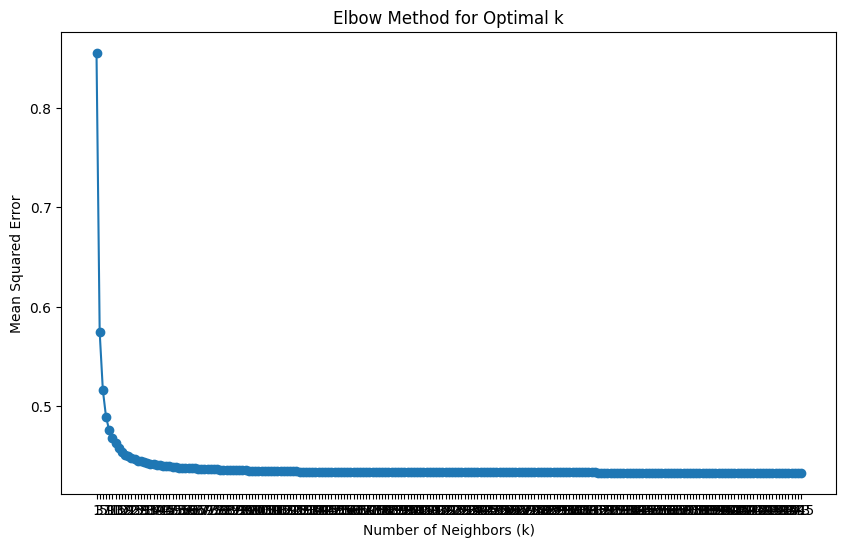

ch:5
ch:6
Optimal k: 441
Test MSE: 0.43322290640582745, Test MAE: 0.44789716862419915


In [89]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

# Assuming taxi_final is your dataset

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]
print("ch:1")
# Data Normalization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Pipeline with SelectKBest and KNN
pipeline = Pipeline([
    ("feature_selection", SelectKBest(f_regression, k=5)),
    ("knn_regressor", KNeighborsRegressor())
])

# Determine range for n_neighbors using sqrt of training size
max_neighbors = int(np.sqrt(taxi_final_train.shape[0]))

# Elbow method
print("ch:2")
errors = []
for n in range(1, max_neighbors + 1, 2):
    pipeline.set_params(knn_regressor__n_neighbors=n)
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    errors.append(mean_squared_error(y_test, y_pred))

# Plot the elbow
print("ch:3")
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_neighbors + 1, 2), errors, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Mean Squared Error')
print("ch:4")
plt.xticks(range(1, max_neighbors + 1, 2))
plt.show()

# Find the optimal k using the elbow method
optimal_k = range(1, max_neighbors + 1, 2)[np.argmin(errors)]
print("ch:5")
# Train final model with optimal k
pipeline.set_params(knn_regressor__n_neighbors=optimal_k)
pipeline.fit(X_train, y_train)
print("ch:6")
# Evaluate on the test set
test_predictions = pipeline.predict(X_test)

test_mse = mean_squared_error(y_test, test_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

print(f"Optimal k: {optimal_k}")
print(f"Test MSE: {test_mse}, Test MAE: {test_mae}")


In [93]:
taxi_final_train['response'].mean()

2.0492601632943557

### XGBOOST V3

* By recommendation from research, this was a repeatedly experimented on model with many different hyperparameter grids and seeds.

In [114]:
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error

# Assuming taxi_final_train and taxi_final_test are already defined
X_train, y_train = taxi_final_train[key_features], taxi_final_train["response"]
X_test, y_test = taxi_final_test[key_features], taxi_final_test["response"]

# Define the XGBRegressor
xgb = XGBRegressor(objective='reg:squarederror', seed=42)

# Define the hyperparameter grid for RandomizedSearchCV
param_distributions = {
    'max_depth': np.arange(3, 6),
    'learning_rate': np.linspace(0.01, 0.3, 10),
    'n_estimators': np.arange(100, 301, 50),
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2]
}

# Randomized Search with Cross-Validation
random_search = RandomizedSearchCV(
    xgb,
    param_distributions,
    n_iter=50,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=42
)

# Fit the Randomized Search model
random_search.fit(X_train, y_train)

# Best parameters and best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters:", best_params)

# Evaluate on the test set
y_pred = random_search.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error on Test Set:", mae)


KeyboardInterrupt: 

* Another XGBoost with an even larger parameter grid than the previous. Limited the data to 30000 purely experimentally to see if a smaller sample would make a difference.

In [121]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error

# Sample 30k data points from the training set
sample_size = 30000
taxi_final_train_sample = taxi_final_train.sample(n=sample_size, random_state=42)

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train, y_train = taxi_final_train_sample[key_features], taxi_final_train_sample["response"]
X_test, y_test = taxi_final_test[key_features], taxi_final_test["response"]

# Define the XGBRegressor
xgb = XGBRegressor(objective='reg:squarederror', seed=42)

# Define the hyperparameter grid for RandomizedSearchCV
param_distributions = {
    'max_depth': np.arange(3, 11),  # Increasing max depth range
    'learning_rate': np.linspace(0.01, 0.3, 15),  # More granular learning rates
    'n_estimators': np.arange(100, 801, 100),  # More options for number of trees
    'subsample': [0.7, 0.8, 0.9, 1.0],  # Add more subsample options
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],  # Add more colsample options
    'gamma': [0, 0.1, 0.2, 0.3, 0.4]  # Additional gamma values
}

# Randomized Search with Cross-Validation
random_search = RandomizedSearchCV(
    xgb,
    param_distributions,
    n_iter=100,  # Increase number of iterations
    cv=5,  # Increase number of folds for cross-validation
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=42
)

# Fit the Randomized Search model
random_search.fit(X_train, y_train)

# Best parameters and best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters:", best_params)

# Evaluate on the test set
y_pred = best_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error on Test Set:", mae)


Best Parameters: {'subsample': 1.0, 'n_estimators': 700, 'max_depth': 3, 'learning_rate': 0.19642857142857142, 'gamma': 0.3, 'colsample_bytree': 0.9}
Mean Absolute Error on Test Set: 0.4412575993934829


* Addition of Alpha and Lambda variables for L1/L2 regularisation to prevent overfitting. Better training result but roughly 0.81 mean average error for unseen data prediction.

In [124]:
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train, y_train = taxi_final_train_sample[key_features], taxi_final_train_sample["response"]
X_test, y_test = taxi_final_test[key_features], taxi_final_test["response"]

# Define the XGBRegressor
xgb = XGBRegressor(objective='reg:squarederror', seed=42)

# Define the hyperparameter grid for RandomizedSearchCV
param_distributions = {
    'max_depth': np.arange(2, 6),  # Experiment with lower max depth
    'learning_rate': np.linspace(0.005, 0.1, 10),  # Experiment with lower learning rate
    'n_estimators': np.arange(50, 201, 50),  # Reduce the number of estimators
    'subsample': [0.7, 0.8, 0.9],  # Experiment with lower subsample
    'colsample_bytree': [0.7, 0.8, 0.9],  # Experiment with lower colsample_bytree
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],  # Test different gamma values
    'reg_alpha': [0, 0.1, 0.5, 1, 5],  # Experiment with different L1 regularization
    'reg_lambda': [0.1, 0.5, 1, 5, 10]  # Experiment with different L2 regularization
}

# Randomized Search with Cross-Validation
random_search = RandomizedSearchCV(
    xgb,
    param_distributions,
    n_iter=100,
    cv=5,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=42
)

# Fit the Randomized Search model
random_search.fit(X_train, y_train)

# Best parameters and best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters:", best_params)

# Evaluate on the test set
y_pred = best_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
std_dev = np.std(y_pred)

print("Mean Absolute Error on Test Set:", mae)
print("Standard Deviation of Predictions:", std_dev)


Best Parameters: {'subsample': 0.7, 'reg_lambda': 5, 'reg_alpha': 5, 'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.7}
Mean Absolute Error on Test Set: 0.44136933515973314
Standard Deviation of Predictions: 0.71813565


### ENSEMBLE

* The goal was to combine weighted and nonweighted response predictions of support vector regression and XGBoost models, while using the latest performed versions of the models. Computational resources again proved an issue and the resulting unseen test prediction was unremarkable (0.83).

In [134]:
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error

# Sample 30k data points from the training set
sample_size = 30000
taxi_final_train_sample = taxi_final_train.sample(n=sample_size, random_state=42)

# Prepare the dataset
key_features = [col for col in taxi_final_train.columns if col != "response"]

X_train, y_train = taxi_final_train_sample[key_features], taxi_final_train_sample["response"]
X_test, y_test = taxi_final_test[key_features], taxi_final_test["response"]

# Define the XGBRegressor
xgb = XGBRegressor(objective='reg:squarederror', seed=42)

# Define the hyperparameter grid for HalvingRandomSearchCV
param_distributions_xgb = {
    'max_depth': np.arange(2, 6),
    'learning_rate': np.linspace(0.01, 0.1, 5),
    'n_estimators': np.arange(50, 201, 50),
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0.1, 0.5, 1, 5]

    
}

# Halving Random Search with Cross-Validation for XGB
halving_search_xgb = HalvingRandomSearchCV(
    xgb,
    param_distributions_xgb,
    factor=2,
    cv=5,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=42
)

# Fit the Halving Search model for XGB
halving_search_xgb.fit(X_train, y_train)

# Get best estimator
best_xgb = halving_search_xgb.best_estimator_

# Predict using XGB
y_pred_xgb = best_xgb.predict(X_test)

print("Best XGB Parameters:", halving_search_xgb.best_params_)
print("Mean Absolute Error for XGB on Test Set:", mean_absolute_error(y_test, y_pred_xgb))
print("Standard Deviation of XGB Predictions:", np.std(y_pred_xgb))


Best XGB Parameters: {'subsample': 0.7, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 200, 'max_depth': 2, 'learning_rate': 0.0325, 'gamma': 0.1, 'colsample_bytree': 0.8}
Mean Absolute Error for XGB on Test Set: 0.44520813211848553
Standard Deviation of XGB Predictions: 0.7030092


In [140]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

key_features = [col for col in taxi_final_train.columns if col != "response"]

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=3)

# Standardize numerical columns
preprocessor = ColumnTransformer(
    transformers=[
        ("num", Pipeline([("select", feature_selector), ("scale", StandardScaler())]), key_features)
    ]
)

X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]


# XGBoost model
xgb_model = xgb.XGBRegressor(
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    tree_method='gpu_hist'
)

# Create pipeline
pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", xgb_model)
])
"""
# Define parameter grid
param_grid = {
    'max_depth': np.arange(3, 6),
    'learning_rate': np.linspace(0.01, 0.3, 10),
    'n_estimators': np.arange(100, 301, 50),
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2]
}
"""

param_grid = {
    'model__max_depth': [3, 4, 5],
    'model__n_estimators': [50, 100, 310],
    'model__learning_rate': [0.1, 0.01, 0.05],
    'model__subsample': [0.8, 0.9, 1.0],
    'model__colsample_bytree': [0.8, 0.9, 1.0],
    'model__gamma': [0, 0.1, 0.2],
    'model__reg_alpha': [0.1],
    'model__reg_lambda': [1],

    
}

# Grid search
halving_grid_search = HalvingGridSearchCV(pipeline, param_grid, scoring='neg_mean_absolute_error', factor=2, min_resources="exhaust", cv=8, verbose=1)
halving_grid_search.fit(X_train, y_train)

# Best parameters and re-evaluation
best_params = halving_grid_search.best_params_
best_pipeline = halving_grid_search.best_estimator_

# Make predictions
y_pred_train = best_pipeline.predict(X_train)
y_pred_test = best_pipeline.predict(X_test)

# Evaluate
train_mae = mean_absolute_error(y_train, y_pred_train)
test_mae = mean_absolute_error(y_test, y_pred_test)

print(f"Best parameters: {best_params}")
print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")

n_iterations: 10
n_required_iterations: 10
n_possible_iterations: 10
min_resources_: 389
max_resources_: 199516
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 729
n_resources: 389
Fitting 8 folds for each of 729 candidates, totalling 5832 fits


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\core.py:160: UserWarning: [13:43:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\core.py:160: UserWarning: [13:43:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E

KeyboardInterrupt: 

In [129]:
# Define the SVR
svr = SVR()

# Define the hyperparameter grid for HalvingRandomSearchCV
param_distributions_svr = {
    'kernel': ['linear', 'rbf'],
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto'],
    'epsilon': [0.01, 0.1, 0.5, 1]
}

# Halving Random Search with Cross-Validation for SVR
halving_search_svr = HalvingRandomSearchCV(
    svr,
    param_distributions_svr,
    factor=2,
    cv=5,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=42
)

# Fit the Halving Search model for SVR
halving_search_svr.fit(X_train, y_train)

# Get best estimator
best_svr = halving_search_svr.best_estimator_

# Predict using SVR
y_pred_svr = best_svr.predict(X_test)

print("Best SVR Parameters:", halving_search_svr.best_params_)
print("Mean Absolute Error for SVR on Test Set:", mean_absolute_error(y_test, y_pred_svr))
print("Standard Deviation of SVR Predictions:", np.std(y_pred_svr))


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 64 is smaller than n_iter=3000. Running 64 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


KeyboardInterrupt: 

* Nonweighted combination of predictions

In [ ]:
# Average the predictions
y_pred_ensemble = y_pred_xgb##(y_pred_xgb + y_pred_svr) / 2

# Evaluate the ensemble
mae_ensemble = mean_absolute_error(y_test, y_pred_ensemble)
std_dev_ensemble = np.std(y_pred_ensemble)

print("Mean Absolute Error for Ensemble on Test Set:", mae_ensemble)
print("Standard Deviation of Ensemble Predictions:", std_dev_ensemble)


In [125]:
# Calculate and print the standard deviation of the actual response variables
train_std_dev = np.std(y_train)
test_std_dev = np.std(y_test)

print("Standard Deviation of Actual Responses (Train):", train_std_dev)
print("Standard Deviation of Actual Responses (Test):", test_std_dev)


Standard Deviation of Actual Responses (Train): 0.9742171602758801
Standard Deviation of Actual Responses (Test): 0.9637691608930399


* Ensemble export and mean calculation

In [133]:
import pandas as pd
import numpy as np

# Predict using both models
y_pred_xgb = best_xgb.predict(X_pred)
#y_pred_svr = best_svr.predict(X_pred)

# Average the predictions
#y_pred_ensemble = (y_pred_xgb + y_pred_svr) / 2

# Save predictions to a CSV file
xgb_predictions = pd.DataFrame({'response': y_pred_xgb})
xgb_predictions.to_csv("predictions_ensemble_v1.txt", index=False)

# Calculate and display the average of the predictions
average_prediction = np.mean(y_pred_xgb)
print("Average of the ensemble predictions:", average_prediction)


Average of the ensemble predictions: 2.4040546


In [127]:
import pandas as pd
import numpy as np

# Assuming x_pred is already defined

# Predict on the x_pred dataset
predictions = best_model.predict(X_pred)

# Save predictions to a text file
np.savetxt("predictions_v6.txt", predictions, fmt='%f')

# Calculate and display the average of the predictions
average_prediction = np.mean(predictions)
print("Standard Deviation of Predictions:", np.std(y_pred))
print("Average of the predictions:", average_prediction)


Standard Deviation of Predictions: 0.71813565
Average of the predictions: 2.4101303


### Sequential Neural Network (FINAL MODEL)

* A pure neural network model, also quite a simple one, the sequential neural network creates layers of neurons (100 neurons) stacked in a linear progression. It is a feedforward neural network, quite suited for this regression task. Given the multiple extremities, such as very short rides with high tipping rates, and long duration rides with low tips and vice versa, this model was able to specialise and establish cliques among the dataset, leading its strong accuracy. It’s capacity to adapt and learn from varied and complex input features made it the ideal choice to expand it into unseen data. It performed in a remarkably fast training time and can be further improved quite easily.

In [145]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.preprocessing import StandardScaler

# Assuming taxi_final_train and taxi_final_test are already loaded into dataframes
# Separate features and target
#feature_columns = ["pickup_hour", "length_time", "pickup_longitude", "pickup_latitude", "dropoff_longitude", "dropoff_latitude", "trip_distance"]

X_train = taxi_final_train[key_features]
y_train = taxi_final_train["response"]

X_test = taxi_final_test[key_features]
y_test = taxi_final_test["response"]

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create the neural network
model = Sequential()

# Input layer with 100 neurons
model.add(Dense(100, activation='relu', input_shape=(X_train.shape[1],)))

# Output layer for regression
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_absolute_error')

# Fit the model
model.fit(X_train_scaled, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Evaluate the model
test_loss = model.evaluate(X_test_scaled, y_test)
print(f"Test MAE: {test_loss:.4f}")


Epoch 1/10


C:\Users\efurk\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6864/6864 ━━━━━━━━━━━━━━━━━━━━ 5s 628us/step - loss: 0.7363 - val_loss: 0.5950
Epoch 2/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 584us/step - loss: 0.5863 - val_loss: 0.5860
Epoch 3/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 607us/step - loss: 0.5827 - val_loss: 0.5865
Epoch 4/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 566us/step - loss: 0.5800 - val_loss: 0.5821
Epoch 5/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 580us/step - loss: 0.5701 - val_loss: 0.5809
Epoch 6/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 572us/step - loss: 0.5773 - val_loss: 0.5816
Epoch 7/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 575us/step - loss: 0.5776 - val_loss: 0.5826
Epoch 8/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 586us/step - loss: 0.5702 - val_loss: 0.5813
Epoch 9/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 600us/step - loss: 0.5717 - val_loss: 0.5782
Epoch 10/10
6864/6864 ━━━━━━━━━━━━━━━━━━━━ 4s 563us/step - loss: 0.5732 - val_loss: 0.5806
2145/2145 ━━━━━━━━━━━━━━━━━━━━ 1s 364us/step - loss: 0.5687
Test MAE: 0.5705


* FINAL MODEL EXPORT

In [146]:
import numpy as np
import pandas as pd

# Assuming X_pred is a dataframe with the same structure as the training data
# Standardize the features
X_pred_scaled = scaler.transform(X_pred)

# Make predictions
y_pred = model.predict(X_pred_scaled)

# Save predictions to file
np.savetxt("predictions_v13.txt", y_pred, delimiter="\n")


4611/4611 ━━━━━━━━━━━━━━━━━━━━ 2s 410us/step


In [147]:
average_prediction = np.mean(y_pred)
average_prediction

2.9455478

## Conclusion

The use of a sequential neural network model for the taxi fare prediction task proved to be a strategic and effective choice. The model's ability to capture complex, small-cluster-like among the extremities of the dataset, as mentioned before, allowed it to outperform other algorithms like Random Forest, XGBoost, LightGBM, MLP and others. While these models struggled with unseen data, likely due to overfitting or limitations in capturing intricate patterns, the sequential neural network demonstrated strong generalization capabilities and high unseen data accuracy. The linear progression of layers in the sequential neural network provided a straightforward yet powerful architecture, well-suited for the regression problem at hand. This approach highlights the importance of matching the right model to the nature of the data, which ultimately proved the most important in determining an effective prediction.